In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
df = pd.read_csv('df_binary.csv')
df

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0.0,tcp,ftp_data,SF,491.0,0.0,0.0,0.0,0.0,0.0,...,25.0,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0.0,udp,other,SF,146.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0.0,tcp,private,S0,0.0,0.0,0.0,0.0,0.0,0.0,...,26.0,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,anomaly
3,0.0,tcp,http,SF,232.0,8153.0,0.0,0.0,0.0,0.0,...,255.0,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0.0,tcp,http,SF,199.0,420.0,0.0,0.0,0.0,0.0,...,255.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25187,0.0,tcp,exec,RSTO,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,0.03,0.06,0.00,0.00,0.00,0.00,1.00,1.00,anomaly
25188,0.0,tcp,ftp_data,SF,334.0,0.0,0.0,0.0,0.0,0.0,...,39.0,1.00,0.00,1.00,0.18,0.00,0.00,0.00,0.00,anomaly
25189,0.0,tcp,private,REJ,0.0,0.0,0.0,0.0,0.0,0.0,...,13.0,0.05,0.07,0.00,0.00,0.00,0.00,1.00,1.00,anomaly
25190,0.0,tcp,nnsp,S0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,0.08,0.06,0.00,0.00,1.00,1.00,0.00,0.00,anomaly


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25192 entries, 0 to 25191
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     25192 non-null  float64
 1   protocol_type                25192 non-null  object 
 2   service                      25192 non-null  object 
 3   flag                         25192 non-null  object 
 4   src_bytes                    25192 non-null  float64
 5   dst_bytes                    25192 non-null  float64
 6   land                         25192 non-null  float64
 7   wrong_fragment               25192 non-null  float64
 8   urgent                       25192 non-null  float64
 9   hot                          25192 non-null  float64
 10  num_failed_logins            25192 non-null  float64
 11  logged_in                    25192 non-null  float64
 12  num_compromised              25192 non-null  float64
 13  root_shell      

In [3]:
df.describe()


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,25192.000000,2.519200e+04,2.519200e+04,25192.000000,25192.000000,25192.00000,25192.000000,25192.000000,25192.000000,25192.000000,...,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000
mean,305.054104,2.433063e+04,3.491847e+03,0.000079,0.023738,0.00004,0.198039,0.001191,0.394768,0.227850,...,182.532074,115.063036,0.519791,0.082539,0.147453,0.031844,0.285800,0.279846,0.117800,0.118769
std,2686.555640,2.410805e+06,8.883072e+04,0.008910,0.260221,0.00630,2.154202,0.045418,0.488811,10.417352,...,98.993895,110.646850,0.448944,0.187191,0.308367,0.110575,0.445316,0.446075,0.305869,0.317333
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,84.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,255.000000,61.000000,0.510000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.790000e+02,5.302500e+02,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,...,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000
max,42862.000000,3.817091e+08,5.151385e+06,1.000000,3.000000,1.00000,77.000000,4.000000,1.000000,884.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
"""A1. Please evaluate confusion matrix for your classification problem. From confusion matrix, the
other performance metrics such as precision, recall and F1-Score measures for both training and test
data. Based on your observations, infer the models learning outcome (underfit / regularfit / overfit). """
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report

# Assuming df_binary is your dataframe with two classes

# Separate features and target
X = df.drop('class', axis=1)
y = df['class']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object', 'bool']).columns

numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Create and train the model (using k=3 as it was the best performer)
knn_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', KNeighborsClassifier(n_neighbors=3))])
knn_pipeline.fit(X_train, y_train)

# Function to evaluate model
def evaluate_model(X, y, dataset_name):
    y_pred = knn_pipeline.predict(X)
    cm = confusion_matrix(y, y_pred)
    cr = classification_report(y, y_pred, output_dict=True)

    print(f"Confusion Matrix ({dataset_name}):")
    print(cm)
    print(f"\nClassification Report ({dataset_name}):")
    for class_name, metrics in cr.items():
        if isinstance(metrics, dict):
            print(f"{class_name}:")
            print(f"  Precision: {metrics['precision']:.4f}")
            print(f"  Recall: {metrics['recall']:.4f}")
            print(f"  F1-Score: {metrics['f1-score']:.4f}")
    print(f"Accuracy: {cr['accuracy']:.4f}")
    print("\n")

# Evaluate on training data
evaluate_model(X_train, y_train, "Training Data")

# Evaluate on test data
evaluate_model(X_test, y_test, "Test Data")

Confusion Matrix (Training Data):
[[ 9336    42]
 [   25 10750]]

Classification Report (Training Data):
anomaly:
  Precision: 0.9973
  Recall: 0.9955
  F1-Score: 0.9964
normal:
  Precision: 0.9961
  Recall: 0.9977
  F1-Score: 0.9969
macro avg:
  Precision: 0.9967
  Recall: 0.9966
  F1-Score: 0.9967
weighted avg:
  Precision: 0.9967
  Recall: 0.9967
  F1-Score: 0.9967
Accuracy: 0.9967


Confusion Matrix (Test Data):
[[2355   10]
 [  10 2664]]

Classification Report (Test Data):
anomaly:
  Precision: 0.9958
  Recall: 0.9958
  F1-Score: 0.9958
normal:
  Precision: 0.9963
  Recall: 0.9963
  F1-Score: 0.9963
macro avg:
  Precision: 0.9960
  Recall: 0.9960
  F1-Score: 0.9960
weighted avg:
  Precision: 0.9960
  Recall: 0.9960
  F1-Score: 0.9960
Accuracy: 0.9960




In [5]:
"""A2. Calculate MSE, RMSE, MAPE and R2 scores for the price prediction exercise done in Lab 02.
Analyse the results. """

import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder

# Load your dataset
# Assuming df_binary is already loaded. If not, uncomment the following line:
# df_binary = pd.read_pickle('df_binary.pkl')

# Define input features and target output
X = df.drop('class', axis=1)
y = df['class']

# Convert categorical features if necessary
X = pd.get_dummies(X, drop_first=True)

# Convert the target variable to numeric
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize and train a classification model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute classification metrics
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Print the metrics
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)

Accuracy: 0.975788846993451
Confusion Matrix:
 [[2293   72]
 [  50 2624]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.97      2365
           1       0.97      0.98      0.98      2674

    accuracy                           0.98      5039
   macro avg       0.98      0.98      0.98      5039
weighted avg       0.98      0.98      0.98      5039



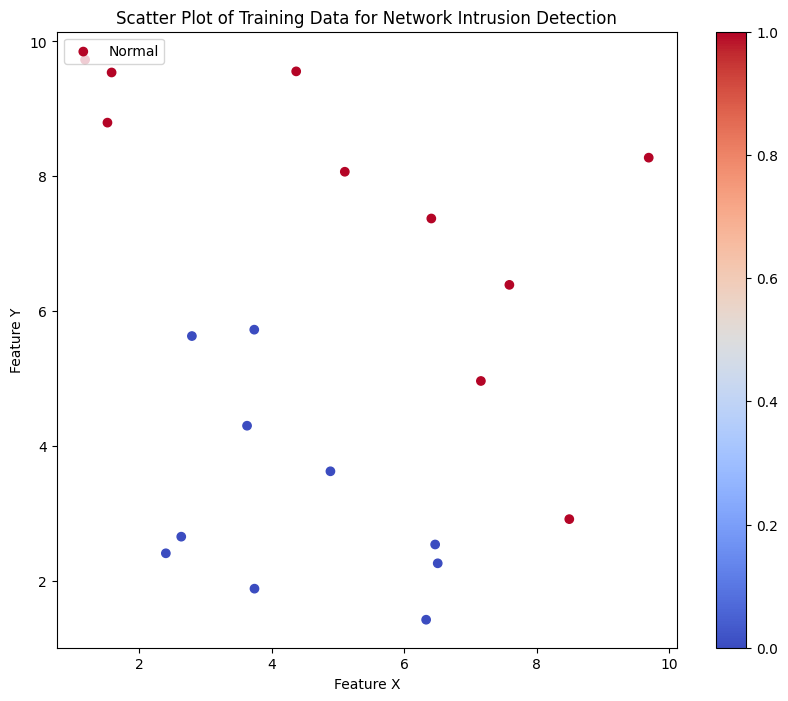

Point 1: X = 4.37, Y = 9.56, Class = 1
Point 2: X = 7.59, Y = 6.39, Class = 1
Point 3: X = 2.40, Y = 2.40, Class = 0
Point 4: X = 1.52, Y = 8.80, Class = 1
Point 5: X = 6.41, Y = 7.37, Class = 1
Point 6: X = 1.19, Y = 9.73, Class = 1
Point 7: X = 8.49, Y = 2.91, Class = 1
Point 8: X = 2.64, Y = 2.65, Class = 0
Point 9: X = 3.74, Y = 5.72, Class = 0
Point 10: X = 4.89, Y = 3.62, Class = 0
Point 11: X = 6.51, Y = 2.26, Class = 0
Point 12: X = 3.63, Y = 4.30, Class = 0
Point 13: X = 5.10, Y = 8.07, Class = 1
Point 14: X = 2.80, Y = 5.63, Class = 0
Point 15: X = 6.33, Y = 1.42, Class = 0
Point 16: X = 6.47, Y = 2.53, Class = 0
Point 17: X = 1.59, Y = 9.54, Class = 1
Point 18: X = 9.69, Y = 8.28, Class = 1
Point 19: X = 3.74, Y = 1.88, Class = 0
Point 20: X = 7.16, Y = 4.96, Class = 1

Feature Statistics:
X - Mean: 4.81, Std Dev: 2.39
Y - Mean: 5.40, Std Dev: 2.82

Standardized Data Points:
Point 1: X = -0.18, Y = 1.48, Class = 1
Point 2: X = 1.16, Y = 0.35, Class = 1
Point 3: X = -1.01, Y 

In [6]:
"""A3. Generate 20 data points (training set data) consisting of 2 features (X & Y) whose values vary
randomly between 1 & 10. Based on the values, assign these 20 points to 2 different classes (class0 -
Blue & class1 – Red). Make a scatter plot of the training data and color the points as per their class
color. Observe the plot. """
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Set random seed for reproducibility
np.random.seed(42)

# Generate 20 random data points
X = np.random.uniform(1, 10, (20, 2))

# Assign classes based on a simple rule
# For example, if X + Y > 10, assign to class 1, else class 0
classes = np.where(X[:, 0] + X[:, 1] > 10, 1, 0)

# Create a scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X[:, 0], X[:, 1], c=classes, cmap='coolwarm')

# Add labels and title
plt.xlabel('Feature X')
plt.ylabel('Feature Y')
plt.title('Scatter Plot of Training Data for Network Intrusion Detection')

# Add a color bar
plt.colorbar(scatter)

# Add a legend
plt.legend(['Normal', 'Intrusion'], loc='upper left')

# Show the plot
plt.show()

# Print the data points and their classes
for i, (x, y, cls) in enumerate(zip(X[:, 0], X[:, 1], classes)):
    print(f"Point {i+1}: X = {x:.2f}, Y = {y:.2f}, Class = {cls}")

# Calculate and print the mean and standard deviation for each feature
print("\nFeature Statistics:")
print(f"X - Mean: {X[:, 0].mean():.2f}, Std Dev: {X[:, 0].std():.2f}")
print(f"Y - Mean: {X[:, 1].mean():.2f}, Std Dev: {X[:, 1].std():.2f}")

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Print the standardized data points
print("\nStandardized Data Points:")
for i, (x, y, cls) in enumerate(zip(X_scaled[:, 0], X_scaled[:, 1], classes)):
    print(f"Point {i+1}: X = {x:.2f}, Y = {y:.2f}, Class = {cls}")

Shape of X: (20, 2)
Shape of classes: (20,)
After alignment:
Shape of X: (20, 2)
Shape of classes: (20,)


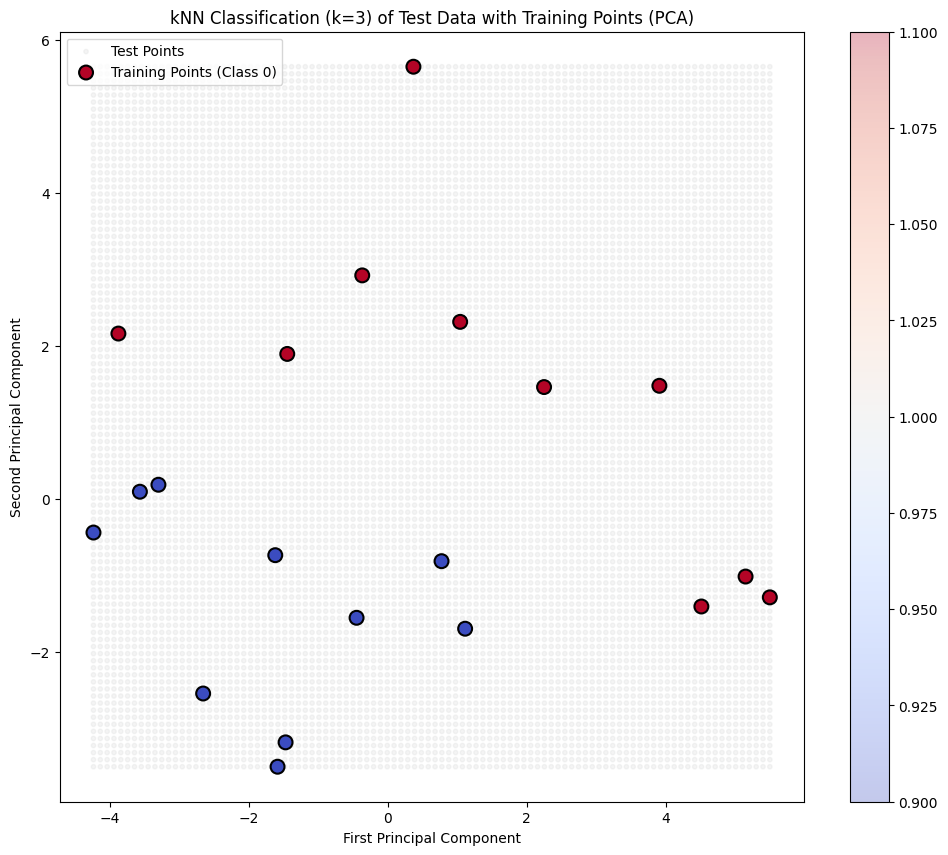

Total test points: 10000
Points classified as Class 0: 0
Points classified as Class 1: 10000


In [7]:
"""A4. Generate test set data with values of X & Y varying between 0 and 10 with increments of 0.1.
This creates a test set of about 10,000 points. Classify these points with above training data using
kNN classifier (k = 3). Make a scatter plot of the test data output with test points colored as per their
predicted class colors (all points predicted class0 are labeled blue color). Observe the color spread
and class boundary lines in the feature space. """
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Set random seed for reproducibility
np.random.seed(42)

# Generate 20 random data points
X = np.random.uniform(1, 10, (20, 2))

# Assign classes based on a simple rule
# For example, if X + Y > 10, assign to class 1, else class 0
classes = np.where(X[:, 0] + X[:, 1] > 10, 1, 0)
# Print shapes to diagnose the issue
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# If X is a DataFrame and classes is a Series, try to align them
if isinstance(X, pd.DataFrame) and isinstance(classes, pd.Series):
    common_index = X.index.intersection(classes.index)
    X = X.loc[common_index]
    classes = classes.loc[common_index]
else:
    # If they are numpy arrays, take the first 20 samples of X to match classes
    X = X[:20]

print("After alignment:")
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# Ensure X and classes have the same number of samples
if X.shape[0] != classes.shape[0]:
    raise ValueError(f"Mismatch in number of samples: X has {X.shape[0]}, classes has {classes.shape[0]}")

# Use PCA to reduce the dimensionality to 2 for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Generate test set
x_test = np.linspace(X_pca[:, 0].min(), X_pca[:, 0].max(), 100)
y_test = np.linspace(X_pca[:, 1].min(), X_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(x_test, y_test)
test_points = np.c_[xx.ravel(), yy.ravel()]

# Standardize both training and test data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train kNN classifier on the full dataset
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_scaled, classes)

# Predict classes for test points
test_points_full = pca.inverse_transform(test_points)
predicted_classes = knn.predict(test_points_full)

# Create scatter plot
plt.figure(figsize=(12, 10))

# Plot test points
scatter = plt.scatter(test_points[:, 0], test_points[:, 1],
                      c=predicted_classes, cmap='coolwarm', alpha=0.3, s=10)

# Plot training points
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=classes, cmap='coolwarm', edgecolor='black', linewidth=1.5, s=100)

plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('kNN Classification (k=3) of Test Data with Training Points (PCA)')
plt.colorbar(scatter)
plt.legend(['Test Points', 'Training Points (Class 0)', 'Training Points (Class 1)'], loc='upper left')

# Show the plot
plt.show()

# Print some statistics
print(f"Total test points: {len(test_points)}")
print(f"Points classified as Class 0: {sum(predicted_classes == 0)}")
print(f"Points classified as Class 1: {sum(predicted_classes == 1)}")


Train accuracy: 0.9969
Test accuracy: 0.9944
Shape of X: (25192, 118)
Shape of classes: (20,)
After alignment:
Shape of X: (20, 118)
Shape of classes: (20,)


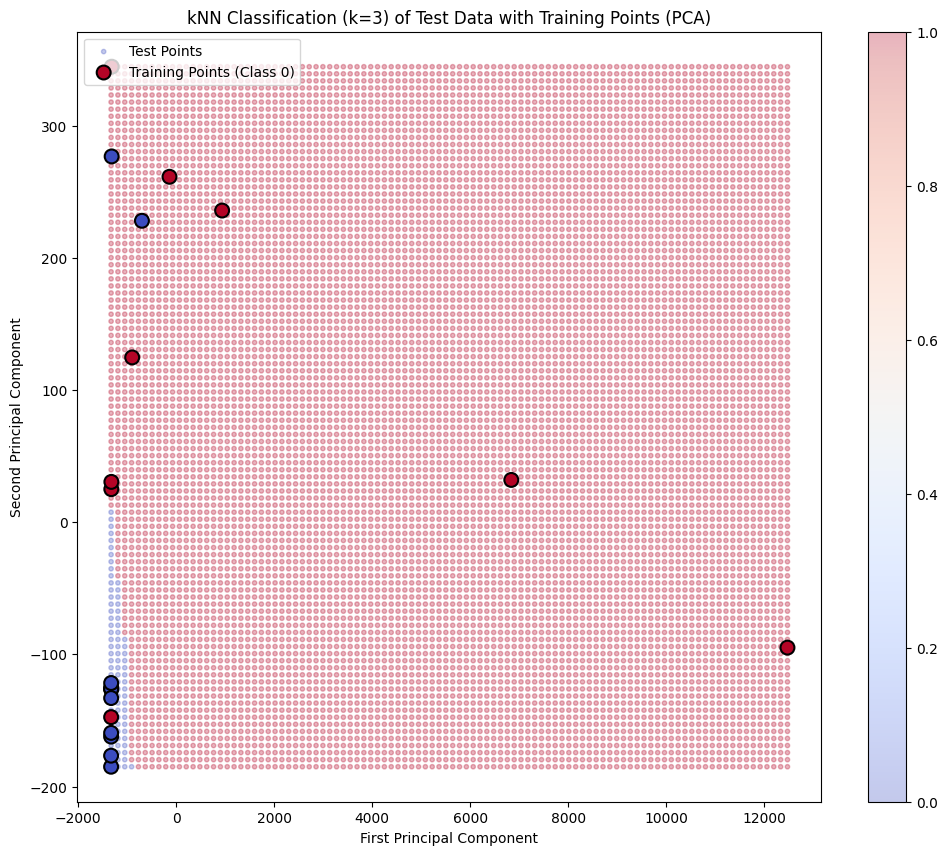

Total test points: 10000
Points classified as Class 0: 84
Points classified as Class 1: 9916


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA


df = pd.read_csv('df_binary.csv')

# Assuming the last column is the target variable (class)
X = df.iloc[:, :-1]  # All columns except the last one
y = df.iloc[:, -1]   # The last column

# Convert categorical variables to numeric if necessary
X = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train kNN classifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_scaled, y_train)

# Evaluate the model
train_accuracy = knn.score(X_train_scaled, y_train)
test_accuracy = knn.score(X_test_scaled, y_test)
print(f"\nTrain accuracy: {train_accuracy:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

# Use PCA to reduce dimensionality for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)

"""A4. Generate test set data with values of X & Y varying between 0 and 10 with increments of 0.1.
This creates a test set of about 10,000 points. Classify these points with above training data using
kNN classifier (k = 3). Make a scatter plot of the test data output with test points colored as per their
predicted class colors (all points predicted class0 are labeled blue color). Observe the color spread
and class boundary lines in the feature space. """
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA




# Print shapes to diagnose the issue
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# If X is a DataFrame and classes is a Series, try to align them
if isinstance(X, pd.DataFrame) and isinstance(classes, pd.Series):
    common_index = X.index.intersection(classes.index)
    X = X.loc[common_index]
    classes = classes.loc[common_index]
else:
    # If they are numpy arrays, take the first 20 samples of X to match classes
    X = X[:20]

print("After alignment:")
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# Ensure X and classes have the same number of samples
if X.shape[0] != classes.shape[0]:
    raise ValueError(f"Mismatch in number of samples: X has {X.shape[0]}, classes has {classes.shape[0]}")

# Use PCA to reduce the dimensionality to 2 for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Generate test set
x_test = np.linspace(X_pca[:, 0].min(), X_pca[:, 0].max(), 100)
y_test = np.linspace(X_pca[:, 1].min(), X_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(x_test, y_test)
test_points = np.c_[xx.ravel(), yy.ravel()]

# Standardize both training and test data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train kNN classifier on the full dataset
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_scaled, classes)

# Predict classes for test points
test_points_full = pca.inverse_transform(test_points)
predicted_classes = knn.predict(test_points_full)

# Create scatter plot
plt.figure(figsize=(12, 10))

# Plot test points
scatter = plt.scatter(test_points[:, 0], test_points[:, 1],
                      c=predicted_classes, cmap='coolwarm', alpha=0.3, s=10)

# Plot training points
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=classes, cmap='coolwarm', edgecolor='black', linewidth=1.5, s=100)

plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('kNN Classification (k=3) of Test Data with Training Points (PCA)')
plt.colorbar(scatter)
plt.legend(['Test Points', 'Training Points (Class 0)', 'Training Points (Class 1)'], loc='upper left')

# Show the plot
plt.show()

# Print some statistics
print(f"Total test points: {len(test_points)}")
print(f"Points classified as Class 0: {sum(predicted_classes == 0)}")
print(f"Points classified as Class 1: {sum(predicted_classes == 1)}")

Shape of X: (20, 118)
Shape of classes: (20,)
After alignment:
Shape of X: (20, 118)
Shape of classes: (20,)


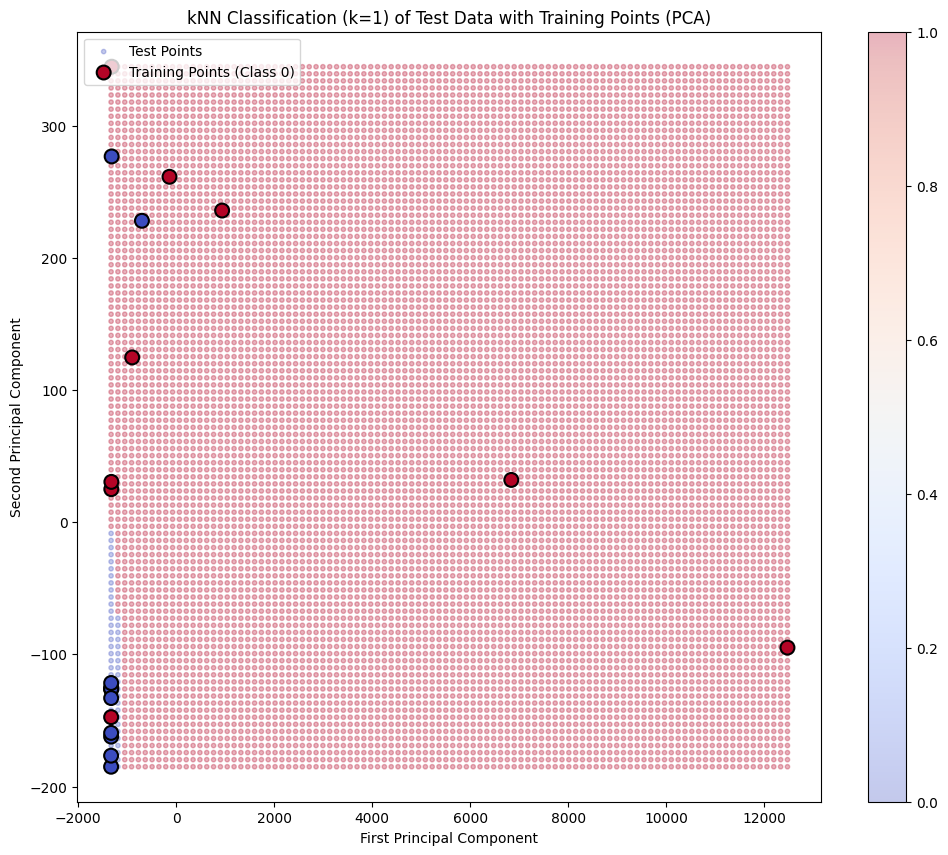

k = 1
Total test points: 10000
Points classified as Class 0: 56
Points classified as Class 1: 9944




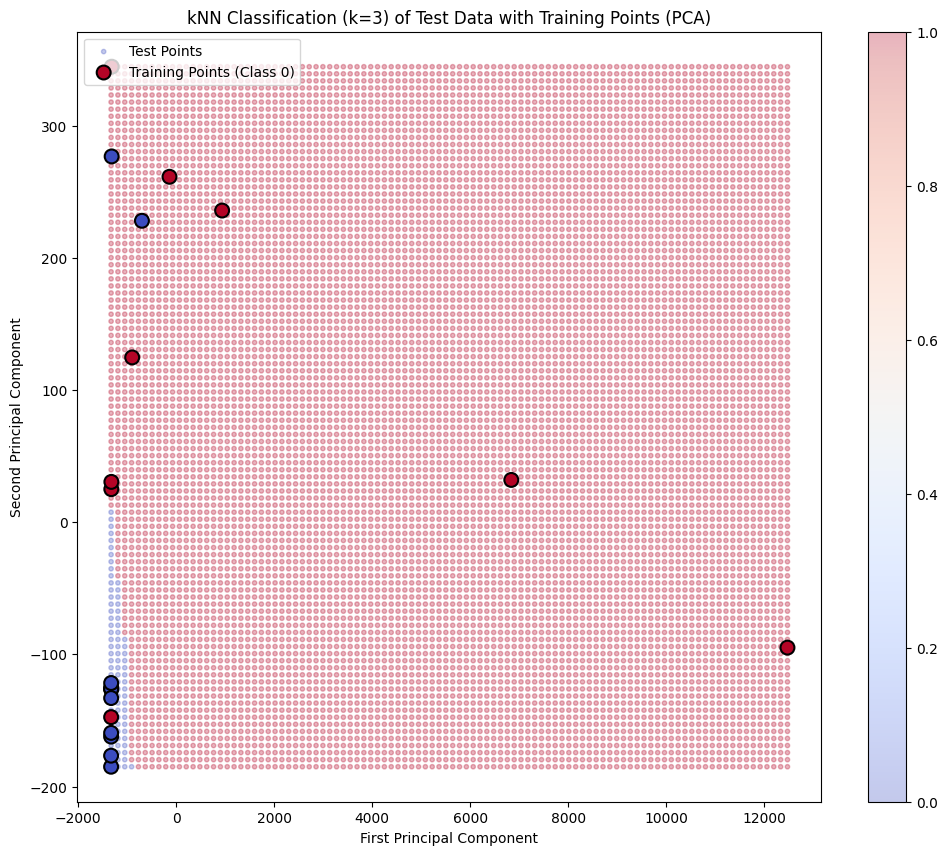

k = 3
Total test points: 10000
Points classified as Class 0: 84
Points classified as Class 1: 9916




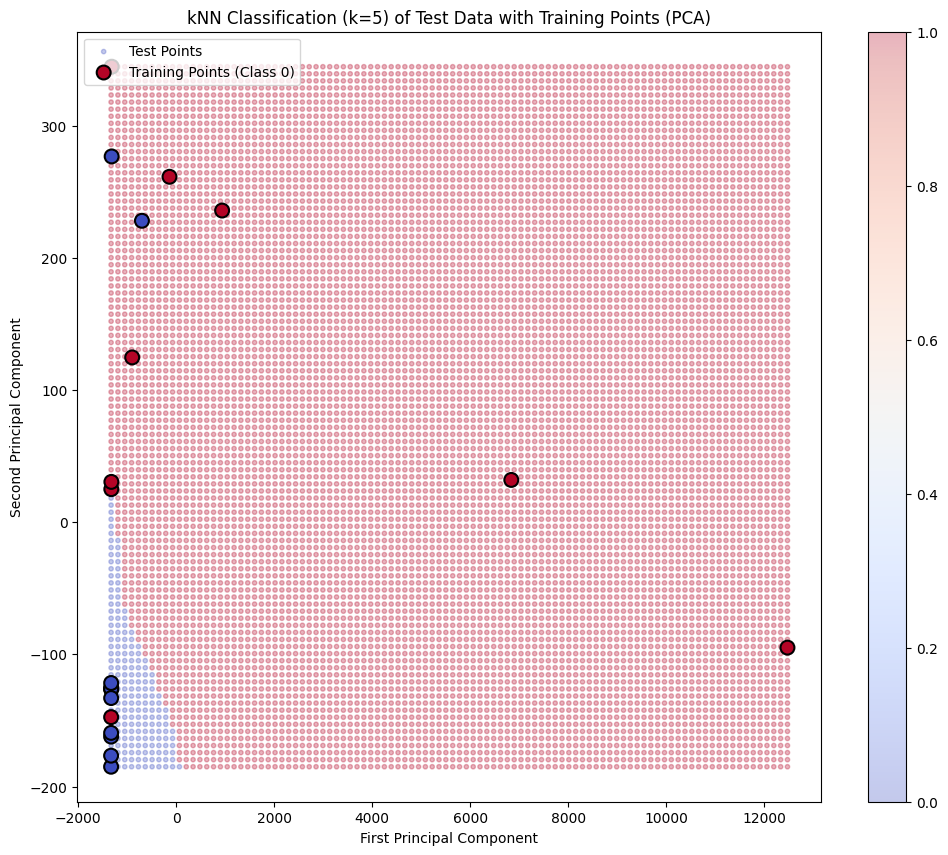

k = 5
Total test points: 10000
Points classified as Class 0: 190
Points classified as Class 1: 9810




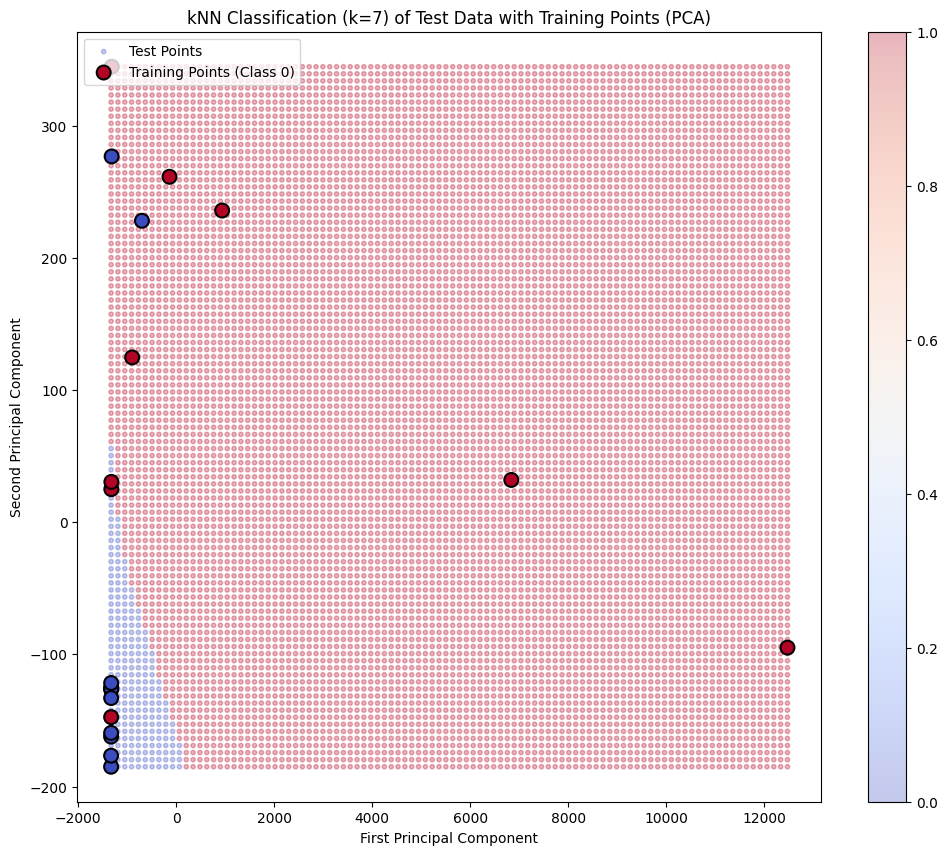

k = 7
Total test points: 10000
Points classified as Class 0: 232
Points classified as Class 1: 9768




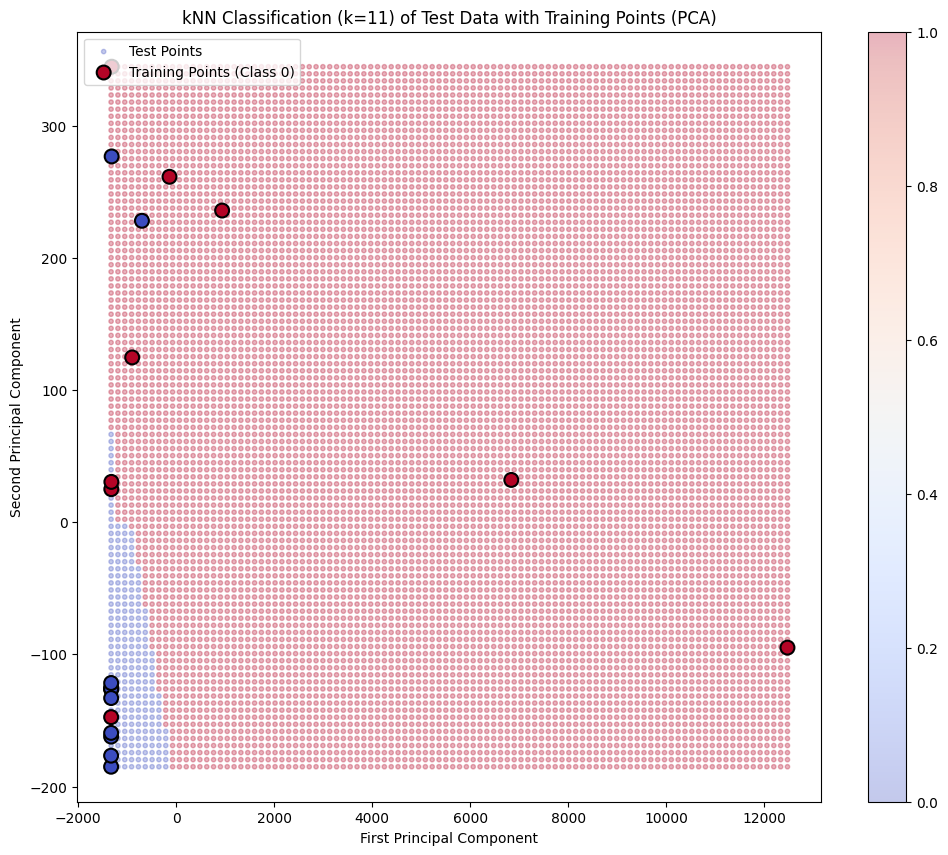

k = 11
Total test points: 10000
Points classified as Class 0: 238
Points classified as Class 1: 9762




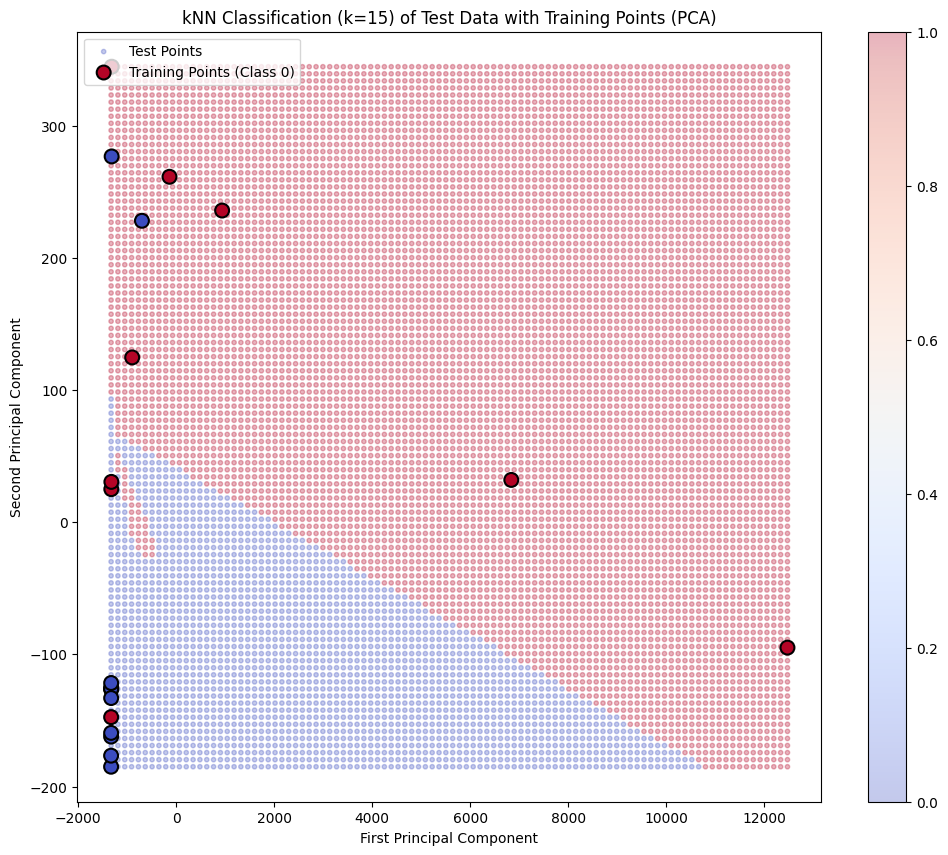

k = 15
Total test points: 10000
Points classified as Class 0: 2112
Points classified as Class 1: 7888




In [9]:
"""A5. Repeat A4 exercise for various values of k and observe the change in the class boundary lines. """
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Print shapes to diagnose the issue
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# If X is a DataFrame and classes is a Series, try to align them
if isinstance(X, pd.DataFrame) and isinstance(classes, pd.Series):
    common_index = X.index.intersection(classes.index)
    X = X.loc[common_index]
    classes = classes.loc[common_index]
else:
    # If they are numpy arrays, take the first 20 samples of X to match classes
    X = X[:20]

print("After alignment:")
print("Shape of X:", X.shape)
print("Shape of classes:", classes.shape)

# Ensure X and classes have the same number of samples
if X.shape[0] != classes.shape[0]:
    raise ValueError(f"Mismatch in number of samples: X has {X.shape[0]}, classes has {classes.shape[0]}")

# Use PCA to reduce the dimensionality to 2 for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Generate test set
x_test = np.linspace(X_pca[:, 0].min(), X_pca[:, 0].max(), 100)
y_test = np.linspace(X_pca[:, 1].min(), X_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(x_test, y_test)
test_points = np.c_[xx.ravel(), yy.ravel()]

# Standardize both training and test data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Function to plot decision boundary for a given k
def plot_decision_boundary(k):
    # Train kNN classifier on the full dataset
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_scaled, classes)

    # Predict classes for test points
    test_points_full = pca.inverse_transform(test_points)
    predicted_classes = knn.predict(test_points_full)

    # Create scatter plot
    plt.figure(figsize=(12, 10))

    # Plot test points
    scatter = plt.scatter(test_points[:, 0], test_points[:, 1],
                          c=predicted_classes, cmap='coolwarm', alpha=0.3, s=10)

    # Plot training points
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=classes, cmap='coolwarm', edgecolor='black', linewidth=1.5, s=100)

    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.title(f'kNN Classification (k={k}) of Test Data with Training Points (PCA)')
    plt.colorbar(scatter)
    plt.legend(['Test Points', 'Training Points (Class 0)', 'Training Points (Class 1)'], loc='upper left')

    # Show the plot
    plt.show()

    # Print some statistics
    print(f"k = {k}")
    print(f"Total test points: {len(test_points)}")
    print(f"Points classified as Class 0: {sum(predicted_classes == 0)}")
    print(f"Points classified as Class 1: {sum(predicted_classes == 1)}")
    print("\n")

# List of k values to try
k_values = [1, 3, 5, 7, 11, 15]

# Plot decision boundaries for different k values
for k in k_values:
    plot_decision_boundary(k)


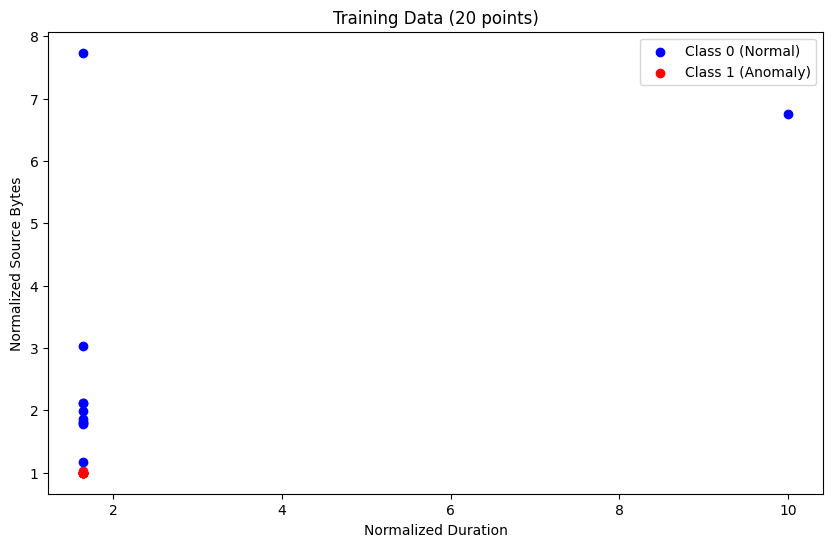

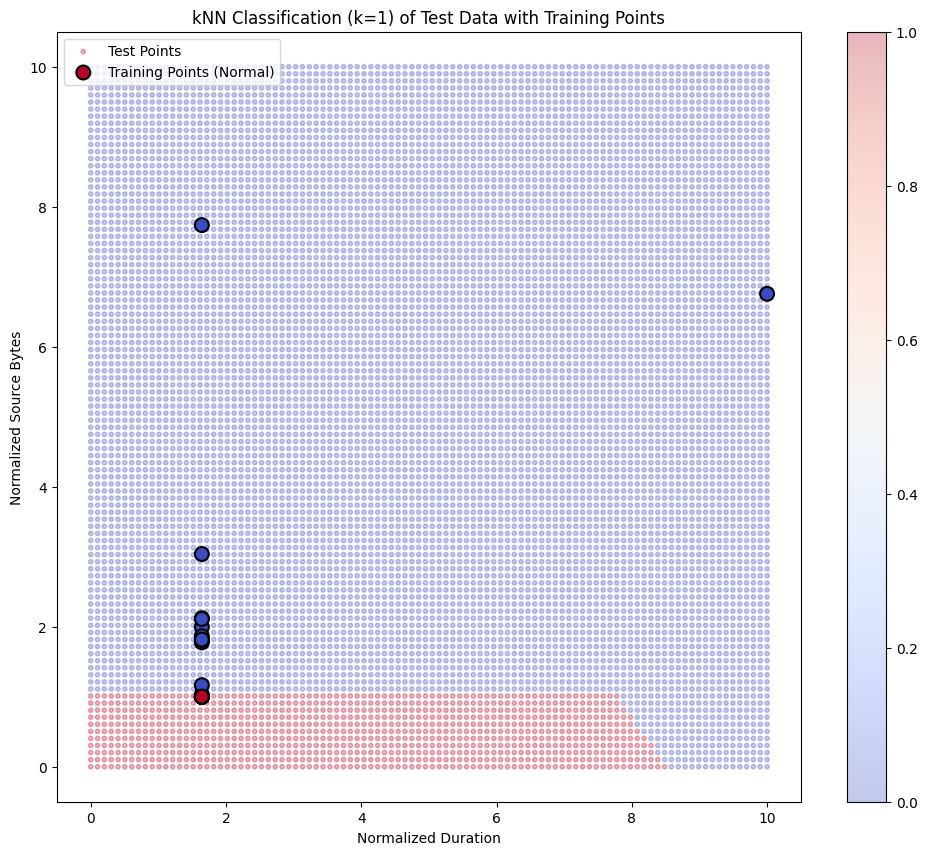

k = 1
Total test points: 10000
Points classified as Normal: 9107
Points classified as Anomaly: 893




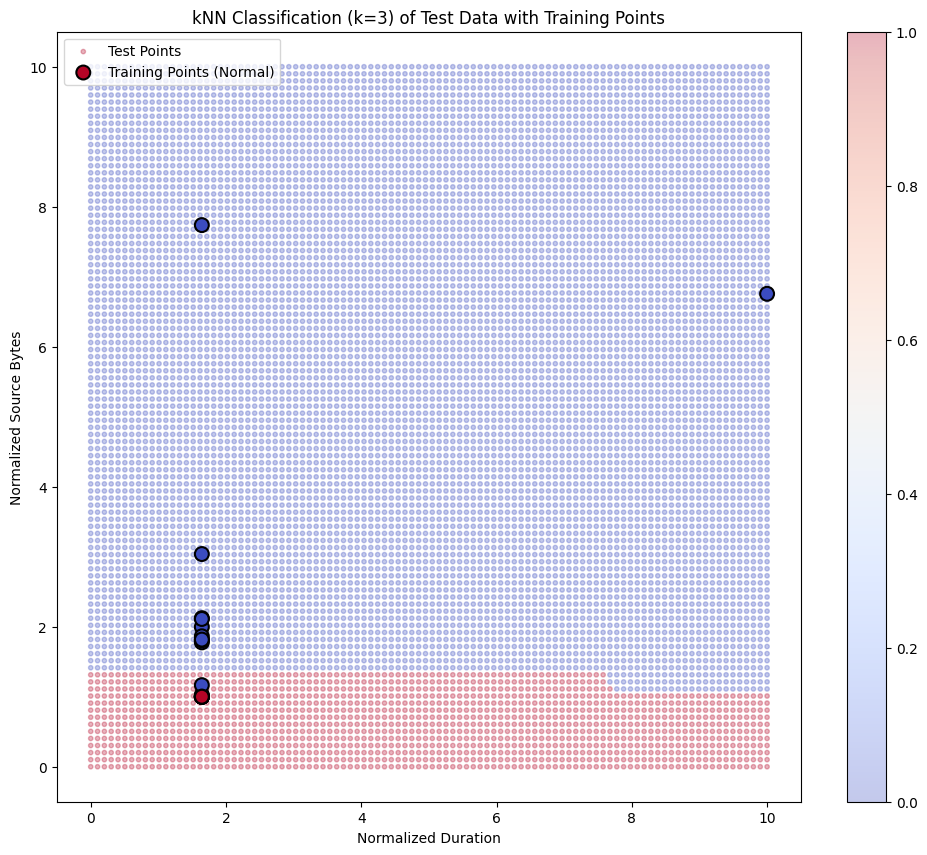

k = 3
Total test points: 10000
Points classified as Normal: 8671
Points classified as Anomaly: 1329




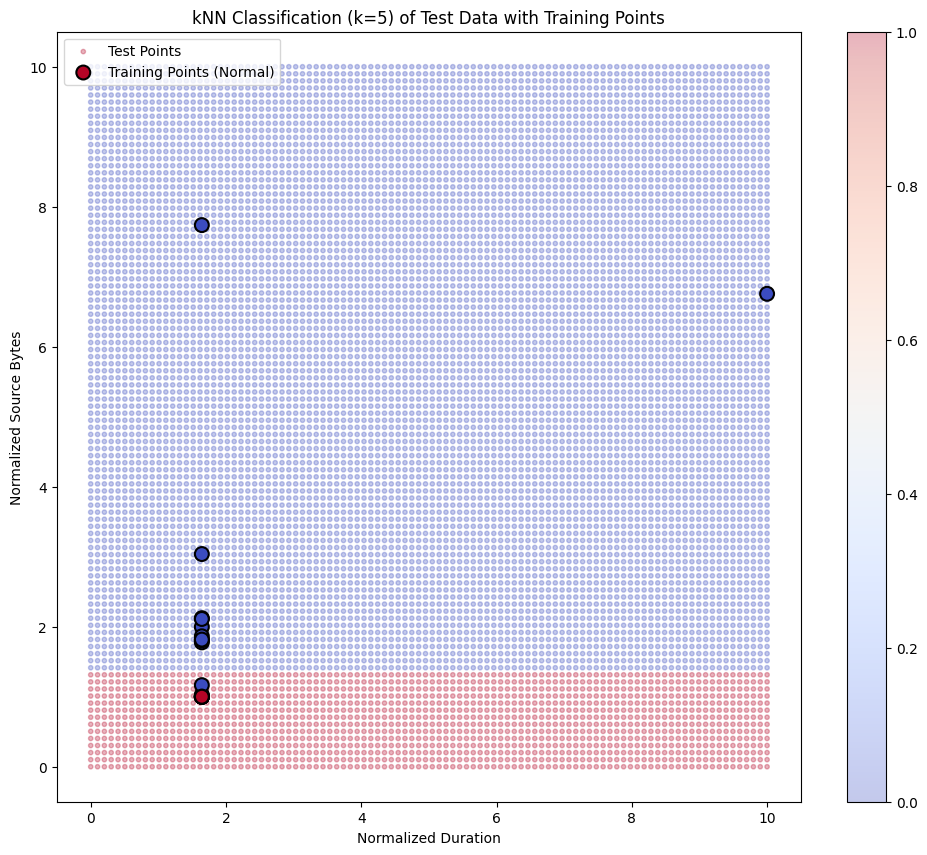

k = 5
Total test points: 10000
Points classified as Normal: 8600
Points classified as Anomaly: 1400




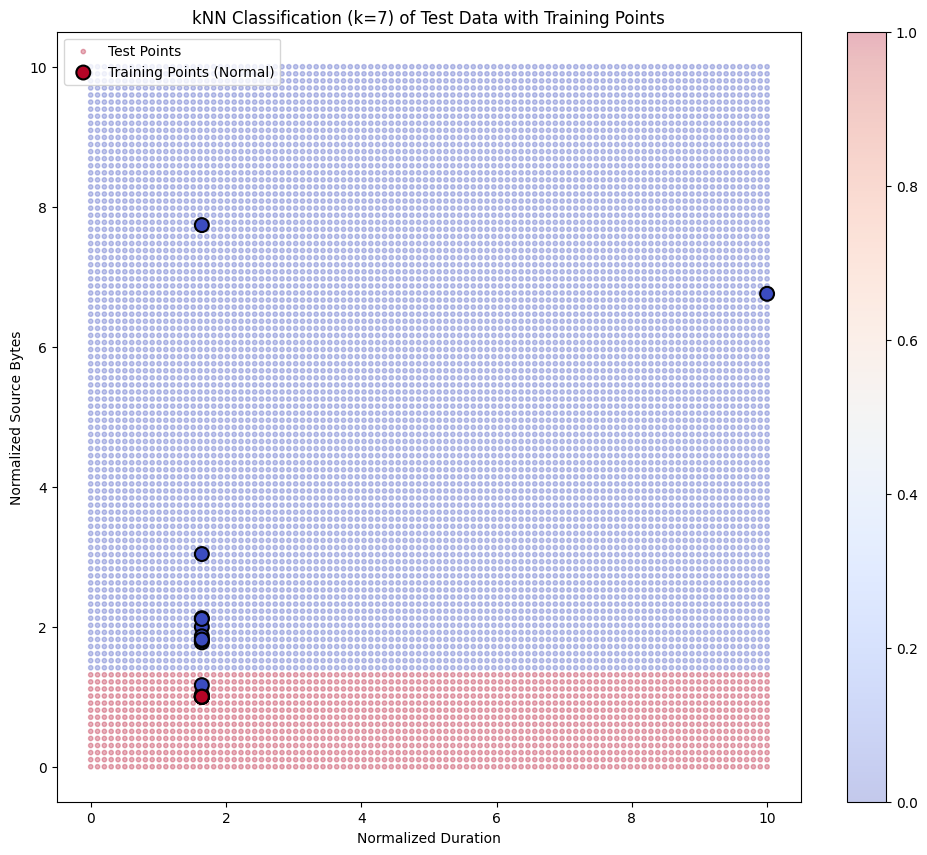

k = 7
Total test points: 10000
Points classified as Normal: 8600
Points classified as Anomaly: 1400




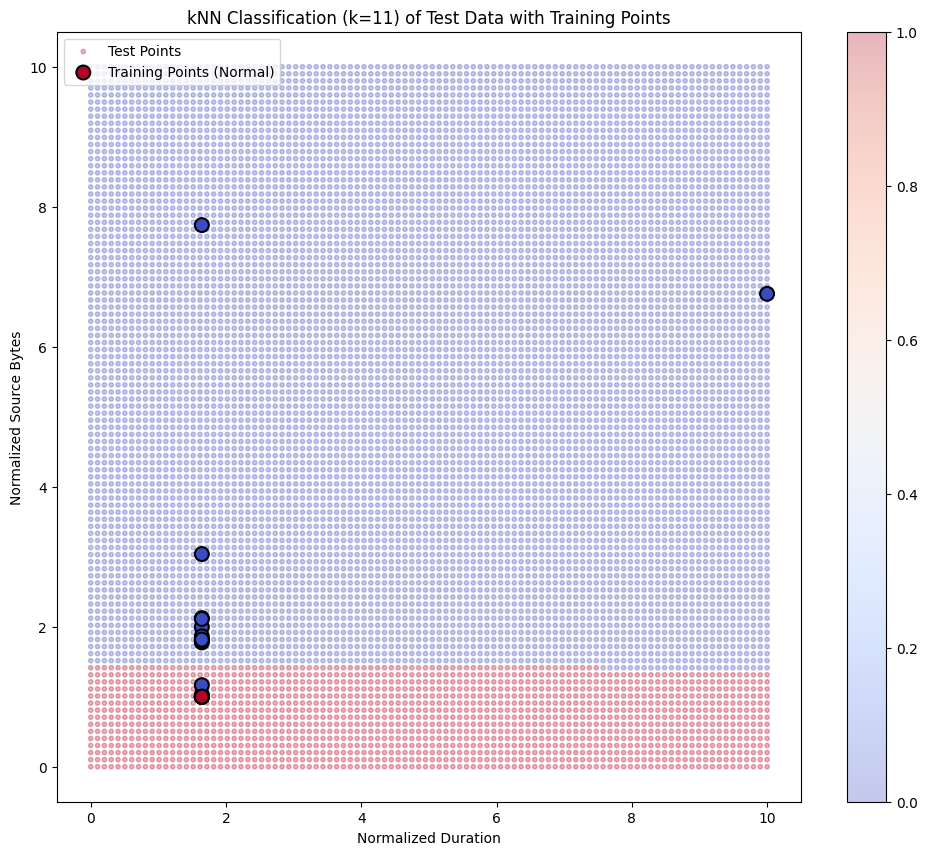

k = 11
Total test points: 10000
Points classified as Normal: 8525
Points classified as Anomaly: 1475




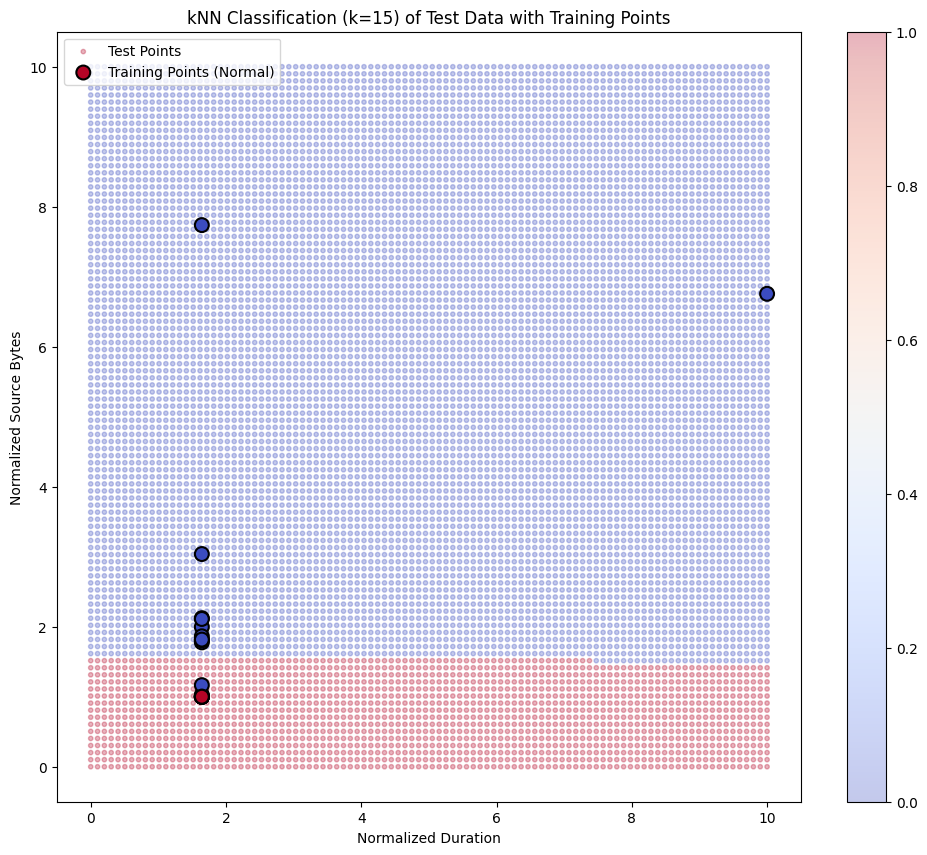

k = 15
Total test points: 10000
Points classified as Normal: 8426
Points classified as Anomaly: 1574




In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier


# Select features and target
X = df[['duration', 'src_bytes']]
y = df['class'].map({'normal': 0, 'anomaly': 1})

# A3: Generate 20 training points
X_train, _, y_train, _ = train_test_split(X, y, train_size=20, random_state=42)

# Normalize X_train to [1, 10] range
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_normalized = (X_train_scaled - X_train_scaled.min()) / (X_train_scaled.max() - X_train_scaled.min()) * 9 + 1

# Scatter plot of training data
plt.figure(figsize=(10, 6))
plt.scatter(X_train_normalized[y_train == 0, 0], X_train_normalized[y_train == 0, 1], color='blue', label='Class 0 (Normal)')
plt.scatter(X_train_normalized[y_train == 1, 0], X_train_normalized[y_train == 1, 1], color='red', label='Class 1 (Anomaly)')
plt.xlabel('Normalized Duration')
plt.ylabel('Normalized Source Bytes')
plt.title('Training Data (20 points)')
plt.legend()
plt.show()

# A4 and A5: Generate test set and classify with different k values
def plot_decision_boundary(k):
    # Generate test set
    x_test = np.linspace(0, 10, 100)
    y_test = np.linspace(0, 10, 100)
    xx, yy = np.meshgrid(x_test, y_test)
    test_points = np.c_[xx.ravel(), yy.ravel()]

    # Train kNN classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_normalized, y_train)

    # Predict classes for test points
    predicted_classes = knn.predict(test_points)

    # Create scatter plot
    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(test_points[:, 0], test_points[:, 1],
                          c=predicted_classes, cmap='coolwarm', alpha=0.3, s=10)
    plt.scatter(X_train_normalized[:, 0], X_train_normalized[:, 1], c=y_train, cmap='coolwarm', edgecolor='black', linewidth=1.5, s=100)
    plt.xlabel('Normalized Duration')
    plt.ylabel('Normalized Source Bytes')
    plt.title(f'kNN Classification (k={k}) of Test Data with Training Points')
    plt.colorbar(scatter)
    plt.legend(['Test Points', 'Training Points (Normal)', 'Training Points (Anomaly)'], loc='upper left')
    plt.show()

    # Print some statistics
    print(f"k = {k}")
    print(f"Total test points: {len(test_points)}")
    print(f"Points classified as Normal: {sum(predicted_classes == 0)}")
    print(f"Points classified as Anomaly: {sum(predicted_classes == 1)}")
    print("\n")

# List of k values to try
k_values = [1, 3, 5, 7, 11, 15]

# Plot decision boundaries for different k values
for k in k_values:
    plot_decision_boundary(k)

In [11]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report



# Select multiple features
features = ['duration', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent',
            'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
            'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
            'num_access_files', 'num_outbound_cmds', 'is_host_login', 'is_guest_login',
            'count', 'srv_count', 'serror_rate', 'srv_serror_rate']

X = df[features]
y = df['class'].map({'normal': 0, 'anomaly': 1})

# ... rest of the code remains similar, but now works with multiple features

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid
param_grid = {'n_neighbors': range(1, 31)}  # Testing k values from 1 to 30

# Create a kNN classifier
knn = KNeighborsClassifier()

# Create a GridSearchCV object
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_knn = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_knn.predict(X_test_scaled)

# Print the accuracy and classification report
print("\nAccuracy on test set:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Print the scores for all k values
cv_results = grid_search.cv_results_
for mean_score, params in zip(cv_results["mean_test_score"], cv_results["params"]):
    print(f"k={params['n_neighbors']}: mean accuracy = {mean_score:.3f}")

Best parameters: {'n_neighbors': 1}
Best cross-validation score: 0.9649184576357055

Accuracy on test set: 0.9636832704901767

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2674
           1       0.97      0.95      0.96      2365

    accuracy                           0.96      5039
   macro avg       0.96      0.96      0.96      5039
weighted avg       0.96      0.96      0.96      5039

k=1: mean accuracy = 0.965
k=2: mean accuracy = 0.963
k=3: mean accuracy = 0.963
k=4: mean accuracy = 0.963
k=5: mean accuracy = 0.961
k=6: mean accuracy = 0.961
k=7: mean accuracy = 0.960
k=8: mean accuracy = 0.960
k=9: mean accuracy = 0.958
k=10: mean accuracy = 0.959
k=11: mean accuracy = 0.959
k=12: mean accuracy = 0.958
k=13: mean accuracy = 0.957
k=14: mean accuracy = 0.957
k=15: mean accuracy = 0.955
k=16: mean accuracy = 0.956
k=17: mean accuracy = 0.955
k=18: mean accuracy = 0.955
k=19: mean accuracy = 0.955
